# Computer Vision - P3

## Delivery

Up to **1 point out of 10** will be penalized if the following requirements are not fulfilled:

- Implemented code should be commented.

- The questions introduced in the exercises must be answered.

- Add title to the figures to explain what is displayed.

- Comments need to be in **English**.

- The deliverable of both parts must be a file named **P3_Student1_Student2.zip** that includes:
    - The notebook P3_Student1_Student2.ipynb completed with the solutions to the exercises and their corresponding comments.
    - All the images used in this notebook.

**Deadline (Campus Virtual): November 1st, 23:00 h** 

==============================================================================================
## Practicum 3: Image and Video Segmentation

==============================================================================================

The main topics of Laboratory 3 are:

3.1. Segmentation of video shots with static scenes.

3.2. Background subtraction.

3.3. Segmentation of images.

The following chapters of the book “Computer Vision: Algorithms and Applicatons” from Richard Szeliski have further information about the topic:

* Chapter 4: Computer Vision: Algorithms and Applications.

* Chapter 5: Segmentation.



## Video segmentation

Given the video stored in ‘Barcelona-sequence’, which contains images acquired by a static camera, we ask you to:
- Find the temporal segments of the video (shots). Where the scene change? (Section 3.1)
- Extract the background images and thus, remove all the "artifacts" considered as foreground related to movement. (Section 3.2)




<img src="images/screenshot.png" width=600>

## 3.1 Segmentation of video shots

Read and visualize the sequence of images "images/Barcelona-sequence".

**Hint:** In order to read a collection of images, we wil use the function [animation.FuncAnimation](https://matplotlib.org/2.0.0/api/_as_gen/matplotlib.animation.FuncAnimation.html). Observe in the following Example, how FuncAnimation is used to read and visualize a sequence of frames. Explore the parameters of animation.FuncAnimation().

In [1]:
# Example
import numpy as np
import skimage
from skimage import io
import matplotlib.pyplot as plt
import matplotlib.animation as animation

In [2]:
#Changing the pluggin is necessary always when visualizing a video!
%matplotlib nbagg  

In [3]:
# Reading a sequence of images from a folder
ic = io.ImageCollection('images/Barcelona-sequence/*.png')

<IPython.core.display.Javascript object>


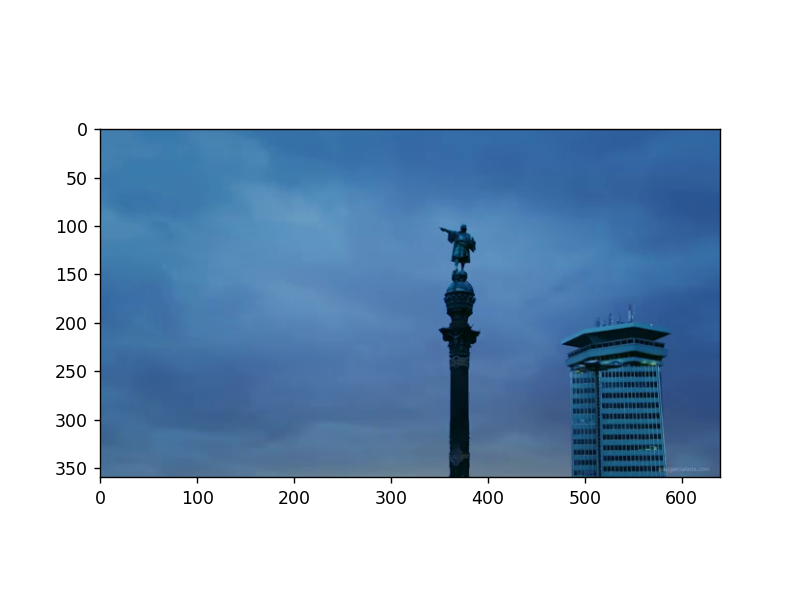

In [4]:
fig = plt.figure()  # Create figure
im = plt.imshow(ic[0], animated=True) #Visualize the first image

def run(i):   #Updating the frame visualization
    im.set_array(ic[i]) #Changing the content of the canvas
    return im, #to return a tuple!

plt.show()
ani = animation.FuncAnimation(fig, run, interval=1, blit=True, frames=len(ic), repeat= False)
plt.show()

a) Find where a shot (scene) finishes and the following starts (the shot boundaries). To achieve this goal, we are going to compute the difference between the histograms of consecutive frames. The proposed solution required:

- Compute the histogram for each RGB channel

- The 'total' histogram of the image is computed as the sum of the three histograms

- Compute the mean of the difference (in absolute value) between the histograms of two consecutive frames

Those differences with largest values corresponds to the transitions between shots. 

Therefore, **we need to create a funtion which return an array with the differences between histograms. We will plot the resulting array in order to localice the maximum values as well as a suitable threshold to define localize the transitions.**

<img src="images/histogramshot.png" width=600>
<img src="images/difference_histograms.png">

To solve this exercise, you need to create a **temporal plot** showing a frame by frame difference measure to be defined by you, being applicable to distinguish the shots. Define a criterion to detect the boundaries of the shots and visualize it in a static plot.

In [5]:
def data_gen_V2():
    #In this method we will do the same as Example A but taking into account the real values of the video sequence
    t = data_gen_V2.t
    #First, we create the variable: previous frame. Initializing it as start frame, frame 0.
    previous = skimage.exposure.histogram(skimage.img_as_float(ic[0]), nbins=32)[0]
    
    for frame in range(1, len(ic)):
        t = t + 1
        
        #We create the variable: current frame. It will vary as we go through the frames.
        current = skimage.exposure.histogram(skimage.img_as_float(ic[frame]), nbins=32)[0]
        
        #We save the difference between previous frame histogram and current frame histogram.
        hist_diff = np.abs(previous - current)
        denominador = (ic[frame].shape[0] * ic[frame].shape[1])
        
        #We save the mean of the differences of histograms
        diff_mean = np.mean(hist_diff / denominador)
        
        #We update the variable previous for the next iteration
        previous = current
        # We return both values.
        yield t, diff_mean
         
data_gen_V2.t = 0

b) Additionally, create an interactive plot executing the following code in "Example A". Substitute the bottom plot with the temporal plot showing the differences between the consecutive frames. 

In [6]:
# Example A
def data_gen():
    y = 0  ## Value of interest
    t = 0  ## Temporal value
    while True:
        t += 0.05
        y += 0.1
        yield t, y


<IPython.core.display.Javascript object>


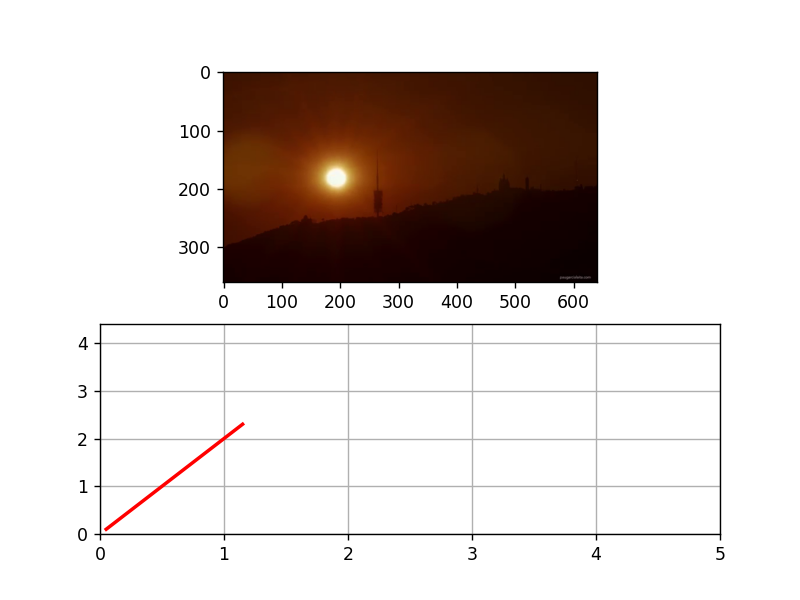

In [7]:
# create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(2,1)

# intialize a line object on the second axes for plotting
line, = ax2.plot([], [], lw=2, color='r')

ax2.set_ylim(0, 1.1)
ax2.set_xlim(0, 5)
ax2.grid()


# initialize the data arrays 
xdata, ydata = [], []
def run(data):
    # update the data plot
    t, y = data
    xdata.append(t) # time = x axis
    ydata.append(y) # y axis

    # Plot image on top row
    ax1.imshow(ic[len(xdata)])
          
    # Plot sin in bottom row
    xmin, xmax = ax2.get_xlim()
    ymin, ymax = ax2.get_ylim()
    
    if t >= xmax:
        ax2.set_xlim(xmin, 2*xmax)
        ax2.figure.canvas.draw()
    
    if y >= ymax:
        ax2.set_ylim(ymin,2*ymax)
        ax2.figure.canvas.draw()
            
    # update the data of both line objects
    line.set_data(xdata, ydata)

    return line

ani = animation.FuncAnimation(fig, run, data_gen, blit=True, interval=10, repeat=False)
plt.show()


<IPython.core.display.Javascript object>


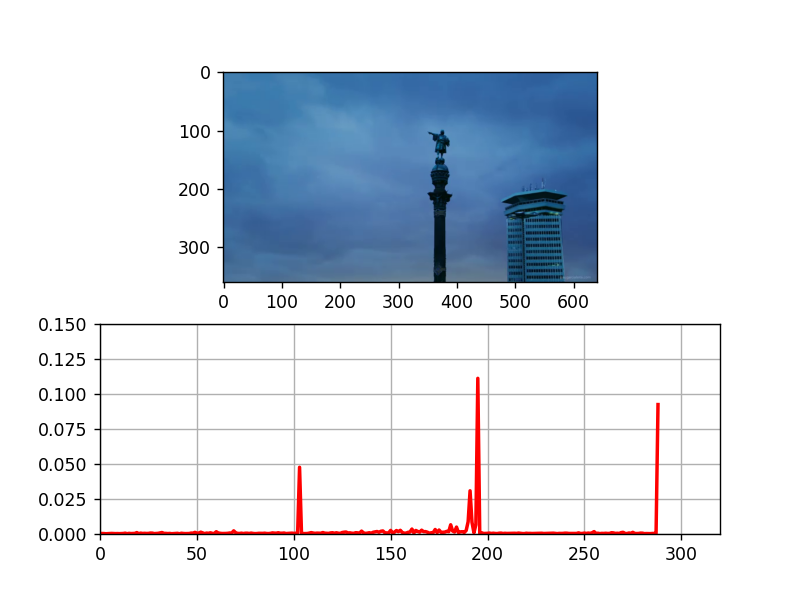

In [8]:
# Your solution here
%matplotlib nbagg

# create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(2,1)

# intialize a line object on the second axes for plotting
line, = ax2.plot([], [], lw=2, color='r')

#We reduce the values of ylim to see more the difference
ax2.set_ylim(0, 0.15)
ax2.set_xlim(0, 5)
ax2.grid()


# initialize the data arrays 
xdata, ydata = [], []
def run(data):
    # update the data plot
    t, y = data
    xdata.append(t) # time = x axis
    ydata.append(y) # y axis

    # Plot image on top row
    ax1.imshow(ic[len(xdata)])
          
    # Plot sin in bottom row
    xmin, xmax = ax2.get_xlim()
    
    if t >= xmax:
        ax2.set_xlim(xmin, 2*xmax)
        ax2.figure.canvas.draw()
            
    # update the data of both line objects
    line.set_data(xdata, ydata)

    return line

ani = animation.FuncAnimation(fig, run, data_gen_V2, blit=True, interval=10, repeat=False)
plt.show()

c) Show the initial and final images of each shot extracted as follows:

<img src="images_for_notebook/result_shot_detection.png">


Use the previous plot to define the proper threshold value over the differences of histograms. Use the threshold to localize indexes of the array returned by the function proposed in the previous question and, therefore, localize the initial and final frames for each shot.


<IPython.core.display.Javascript object>


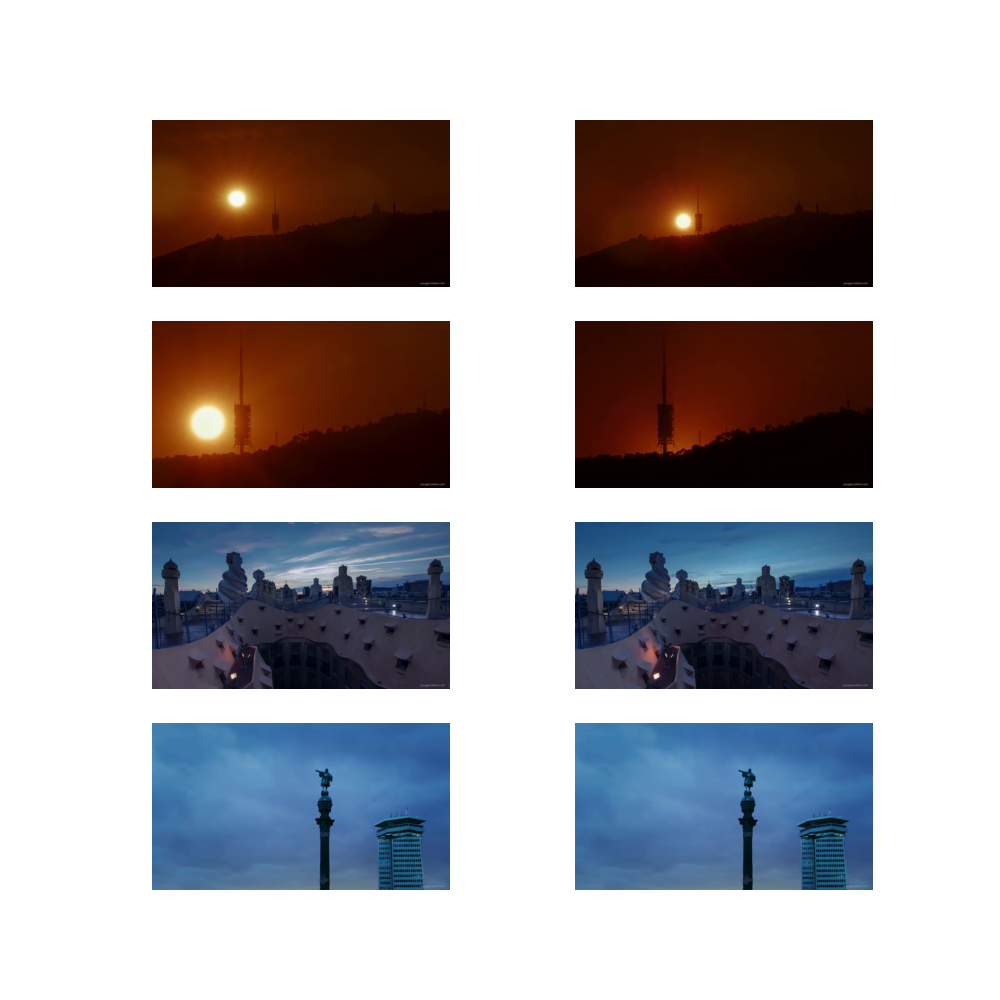

In [9]:
max_cambio_hist = 0.04
frames_iniciales = [0]
frames_finales = []
frames_finales.append(frames_iniciales[0] - 1)


for i in range(len(xdata)):
    if(ydata[i] >= max_cambio_hist):
        frames_iniciales.append(xdata[i])
for j in range(1, len(frames_iniciales)):
    frames_finales.append(frames_iniciales[j] - 1)

    

fig, ax = plt.subplots(ncols = 2, nrows = 4,figsize=(8,8))
ax[0][0].imshow(ic[frames_iniciales[0]])
ax[0][0].axis('off')
ax[1][0].imshow(ic[frames_iniciales[1]])
ax[1][0].axis('off')
ax[2][0].imshow(ic[frames_iniciales[2]])
ax[2][0].axis('off')
ax[3][0].imshow(ic[frames_iniciales[3]])
ax[3][0].axis('off')

    
ax[0][1].imshow(ic[frames_finales[1]])
ax[0][1].axis('off')
ax[1][1].imshow(ic[frames_finales[2]])
ax[1][1].axis('off')
ax[2][1].imshow(ic[frames_finales[3]])
ax[2][1].axis('off')
ax[3][1].imshow(ic[frames_finales[0]])
ax[3][1].axis('off')

plt.show()

d) Which measure have you used in order to visually distinguish the shots in a plot? Explain your solution.
    
    - We have used the histogram, thanks to the average of the difference between the histograms of each frame, we can determine if that frame belongs to one plane or another
    - Visualizing the general histogram, we can determine a specific threshold of 0.04, as the plane change limit

e) Would your video segmentation strategy be able to separate and track objects? Argue your answer.

    - This implementation does not allow us to determine a specific object or find it, we will should make several changes in the method so that it obtains that objective

f) Would your video segmentation strategy be able to capture continuous transition? Argue your answer.

    - If we make a small modification, seeing the histogram differences and observing that there is no sudden change, we could determine that it is a continuous transition and not different planes. 

## 3.2 Background subtraction

Apply the background subtraction algorithm (check theory material).

<img src="images/screenshot2.png" width=500>

a) Visualize the following images for each different scene of the video:

    1) an image belonging to the shot
    2) the background image, and
    3) the foreground.
    
**Hint**: You can construct a mask obtained from the original image and the background in order to know which parts of the image form part from the foreground and recover from the original image just the foreground regions.

In [10]:
from skimage import img_as_float
from skimage.exposure import histogram

def shot(img_index):
    return [ic[img_index[0]], ic[img_index[1]]]

#auxiliar method to get histogram with a specified amount of bins
def hist_data(img, nbins):
    img = img_as_float(img)
    #We do the histograms of the 3D 
    return [histogram(img[:, :, i], nbins)[0] for i in range(3)]

#auxiliar method to get the indices where there's a high variation on histogram_data
def variation():
    indexs = [0]
    for i in range(1, len(ic)):
        histograms = [hist_data(ic[i - 1], 8), hist_data(ic[i], 8)]
        differences = [abs(histograms[0][i] - histograms[1][i]) for i in range(3)]
        
        #high value means a high contrast/difference on histogram data
        if int(np.mean(differences)) > 10000: 
            indexs.append(i - 1), indexs.append(i)
            
    indexs.append(i)
    #return all frames belonging to the same frame   
    return [[indexs[i], indexs[i + 1]] for i in range(0, len(indexs), 2)]


def background_and_foreground(frame):
    background = np.zeros(ic[0].shape)
    images = []
    channels = [[], [], []]
    
    for i in range(frame[0], frame[1] + 1):
        images += [img_as_float(ic[i])]
        
        for j in range(3):
            channels[j] += [img_as_float(ic[i][:, :, j])]
   
    for i in range(3):
        background[:, :, i] = np.median(channels[i], axis = 0)

    foreground = np.abs(images[0] - background)
    
    return [background, foreground]



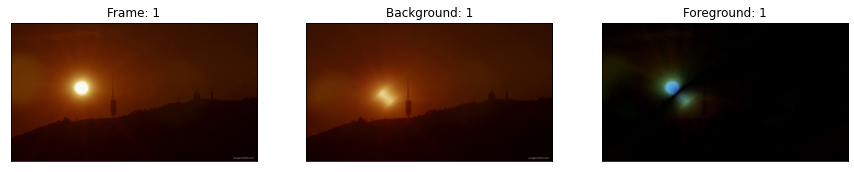

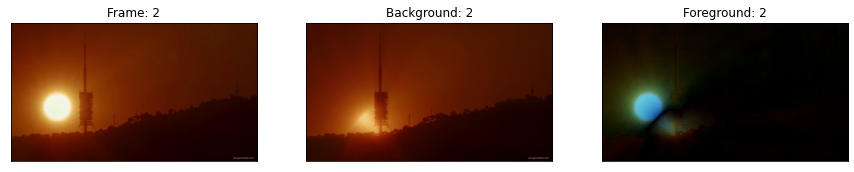

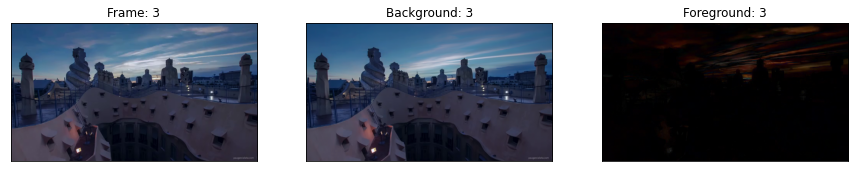

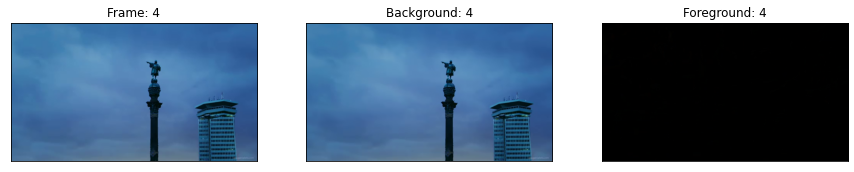

In [12]:
#to show 'n' images
def visualize_n(img_array, title_array):
    
    f, axarr = plt.subplots(1, len(img_array))
    f.set_size_inches(15, 15)
    #loop all img
    for i in range(len(img_array)):
        axarr[i].imshow(img_array[i], cmap = 'gray')
        axarr[i].set_title(title_array[i])
        axarr[i].xaxis.set_visible(False)
        axarr[i].yaxis.set_visible(False)
        
    # Show all the images.
    plt.show()

    
    
%matplotlib inline
frames = variation()
images = []
for frame in frames:
    images += [[shot(frame)[0]] + background_and_foreground(frame)]
    
titles = [["Frame: " + str(i+1), "Background: " + str(i+1), "Foreground: " + str(i+1)] for i in range(len(frames))]
for i in range(len(images)):
    visualize_n(images[i], titles[i])

b) What do the static background images represent? 


- The pixels of the background that don't change over the time

c) What happens if the shots are not correctly extracted? And, what happens if you find too many shots in the video? 

- If the shots are not correctly extracted we could mix scenes. Otherwise, if we find too many shots, we will have less values to extract the background and foreground.

d) What happens if you subtract the background image from the original one?

- We will get the foreground because foreground = np.abs(images[0] - background)


e) In which situations does the algorithm work and in which it does not? Do you see any additional application for this algorithm?

- It only works when the camera is static and when there aren't a lot of changes of contrast and illumination. We could also  use it to eliminate people or noise from a video

f) **[OPTIONAL]**
- Apply the algorithm to some other video that you found.

## 3.3 Segmentation of images

Apply the image segmentation methods (Felzenswhalbs, Slic and Quickshift) based on the clustering of points corresponding to the pixels but in the feature space RGB-XY space.

**Hint**: 
- Different image segmentation commands can be found in skimage.segmentation.
- Use the function segmentation.mark_boundaries for seeing the boundaries of the segments.
- Use the inline pluggin to visualize images (%matplotlib inline).

<img src="images/image_Segmentation.png" width=600>

### Felzenszwalb's efficient graph based segmentation

a) Read 'rocki.jpeg' image from the folder 'images' and segment it using the Felzenszwalbs's method. Comment the result.


(256, 256)
Felzenszwalb number of segments: 522


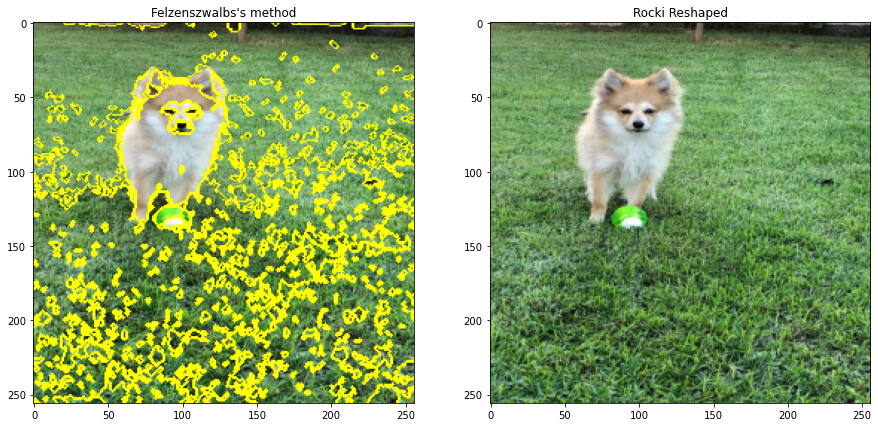

In [13]:
from skimage.segmentation import felzenszwalb, slic, quickshift
from skimage.segmentation import mark_boundaries
from skimage.transform import resize
from skimage.color import rgb2gray
from skimage import img_as_float


# Your solution here
rocki = io.imread("./images/rocki.jpeg")

rocki_reshape = resize(rocki,(256,256,3))

segments_fz = felzenszwalb(rocki_reshape, scale=500, sigma=0.3, min_size=5)

print(segments_fz.shape)
print(f"Felzenszwalb number of segments: {len(np.unique(segments_fz))}")

fig, axs = plt.subplots(ncols=2,figsize=(15,15))
ax = axs[0]
ax.imshow(mark_boundaries(rocki_reshape, segments_fz))
ax.set_title("Felzenszwalbs's method")

ax = axs[1]
ax.imshow(rocki_reshape, cmap='gray')
ax.set_title("Rocki Reshaped")

plt.show()

b) Test and explore different parameters in order to obtain a good image segmentation up to you. 
Answer the following qüestions:
- Is it critical to convert the image in grayscale in order to do the image segmentation?
    - No, you can do the image segmentation without converting the image into grayscale. However, we obtain different results if we convert it into grayscale before using the Felzenszwalb's method as can be seen on "Felzenszwalbs's method on a gray image" where rocki's shape is less detailed
    
    
- Is it critical to convert the image in float in order to do the image segmentation?
    - Absolutely not, it's only critical to convert it to a float image when we operate with a small min_size
    
    
- Which are the optimal values according to your subjective perception?
    - Depending on what we understand as optimal: if we want to optimise time we need a higher value for min_size, if we want to optimise the work and get a more detailed image we need higher values on min_size... and it's the same for the other parameters.
    - The values we have used are:
    - scale=500, sigma=0.3, min_size=5


- How does each parameter behave?
    - scale: float -> Free parameter. Higher means larger clusters.
    - sigma: float -> Width (standard deviation) of Gaussian kernel used in preprocessing.
    - min_size: int -> Minimum component size. Enforced using postprocessing.


- Note: You can reduce the size of the image in order to accelerate the running. Does the image reduction affect the optimal values? 
    - Yes, it affects, on larger images there's a higher number of segments of the min_size we're searching for

(1024, 768)
Felzenszwalb gray number of segments: 7743
(256, 256)
Felzenszwalb gray number of segments: 399
(256, 256)
Felzenszwalb float number of segments: 522


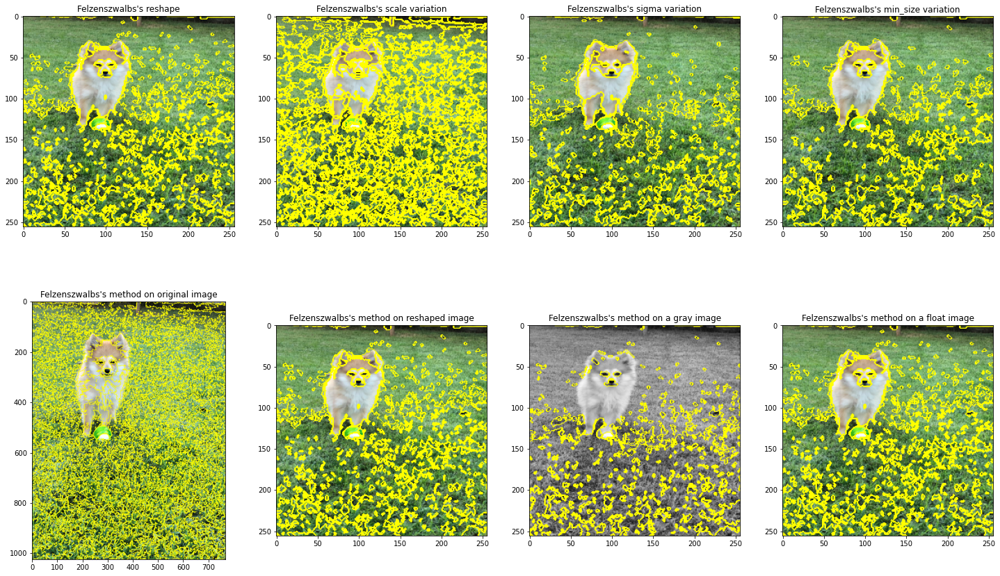

In [16]:
# Your solution here
rocki_gray = rgb2gray(rocki_reshape)
rocki_float = img_as_float(rocki_reshape)

felzenszwalb_orig = felzenszwalb(rocki, scale=500, sigma=0.3, min_size=5)
felzenszwalb_gray = felzenszwalb(rocki_gray, scale=500, sigma=0.3, min_size=5)
felzenszwalb_float = felzenszwalb(rocki_float, scale=500, sigma=0.3, min_size=5)

test0 = felzenszwalb(rocki_reshape, scale=500, sigma=0.3, min_size=5)
test1 = felzenszwalb(rocki_reshape, scale=100, sigma=0.3, min_size=5)
test2 = felzenszwalb(rocki_reshape, scale=500, sigma=0.5, min_size=5)
test3 = felzenszwalb(rocki_reshape, scale=500, sigma=0.3, min_size=10)

print(felzenszwalb_orig.shape)
print(f"Felzenszwalb gray number of segments: {len(np.unique(felzenszwalb_orig))}")

print(felzenszwalb_gray.shape)
print(f"Felzenszwalb gray number of segments: {len(np.unique(felzenszwalb_gray))}")

print(felzenszwalb_float.shape)
print(f"Felzenszwalb float number of segments: {len(np.unique(felzenszwalb_float))}")

fig, axs = plt.subplots(nrows=2,ncols=4,figsize=(25,15))

ax = axs[0][0]
ax.imshow(mark_boundaries(rocki_reshape,test0))
ax.set_title("Felzenszwalbs's reshape")
ax = axs[0][1]
ax.imshow(mark_boundaries(rocki_reshape,test1))
ax.set_title("Felzenszwalbs's scale variation")
ax = axs[0][2]
ax.imshow(mark_boundaries(rocki_reshape,test2))
ax.set_title("Felzenszwalbs's sigma variation")
ax = axs[0][3]
ax.imshow(mark_boundaries(rocki_reshape,test3))
ax.set_title("Felzenszwalbs's min_size variation")

ax = axs[1][0]
ax.imshow(mark_boundaries(rocki,felzenszwalb_orig))
ax.set_title("Felzenszwalbs's method on original image")
ax = axs[1][1]
ax.imshow(mark_boundaries(rocki_reshape,segments_fz))
ax.set_title("Felzenszwalbs's method on reshaped image")
ax = axs[1][2]
ax.imshow(mark_boundaries(rocki_gray,felzenszwalb_gray))
ax.set_title("Felzenszwalbs's method on a gray image")
ax = axs[1][3]
ax.imshow(mark_boundaries(rocki_float,felzenszwalb_float))
ax.set_title("Felzenszwalbs's method on a float image")

plt.show()

c) Comment the definition of the algorithm (use approximately 3 lines at most), its advantages and disadvantages.

In [17]:
# Your solution here

# Felzenszwalb method is based in the efficient graph-based image segmentation algorithm.
# It consists in use a graph and separate it in components. Using the difference between two components
# and the maximum weigth of an edge that connects two nodes of the same component

# Advantages: It's a fast algorithm (O(N·log(N)), take into account that an object might have invariance in intensity
# Disadvantages: we don't know when we should stop or when we should continue


### SLIC - K-Means based image segmentation
d) Segment the same image using the SLIC image segmentation algorithm using the parameters by default. 

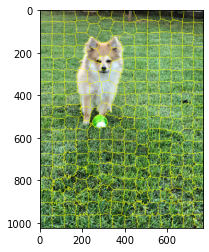

In [18]:
# Your solution here
%matplotlib inline
from skimage.segmentation import felzenszwalb, slic, quickshift

slic_rocki = slic(rocki, n_segments=250, compactness=50, sigma=1, start_label=1)

plt.imshow(mark_boundaries(rocki, slic_rocki))
plt.show()

e) Explore what are the parameters of the slic function. Test different values for these parameters in order to obtain a good image segmentation with SLIC algorithm.
Answer the following qüestions:
- Is it critical to convert the image in grayscale in order to do the image segmentation?
    - It isn't, you can do the image segmentation without converting the image into grayscale. However, we obtain different results if we convert it into grayscale before using the SLIC - K-Means method as can be seen below on "slic method on a gray image" where it's all mathematically perfectly shaped
    

- Is it critical to convert the image in float in order to do the image segmentation?
    - We don't think so, but it's recomandable if you need a more precise extraction of the shape
    

- Which are the optimal values of the optional variables?
    - Again, depends on what we're searching. If we want to optimise time we need a small value on n_segments, if we want more uniformal cubic shapes we need a higher value on compactness, and if we want a more smoothed image we need a higher value on sigma. The values we have used are: n_segments=250, compactness=50, sigma=1, start_label=1


- How does each parameter behave?
    - The parameter n_segments are the approximate number of labels of the segmented image. The parameter compactness balances color proximity. Higher values make superpixel shapes more cubic. The sigma is the width of Gaussian kernel. It smooths the image before the segmentation.

SLIC number of segments: 1
SLIC number of segments: 256
SLIC number of segments: 231


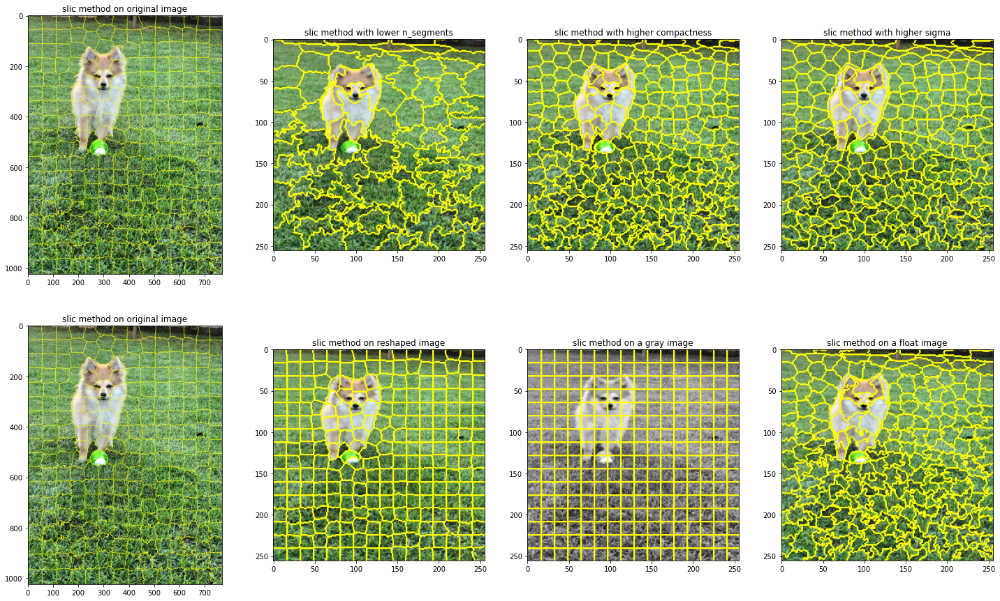

In [19]:
# Your solution here
slic_rocki_reshape = slic(rocki_reshape, n_segments=250, compactness=50, sigma=1, start_label=1)
slic_gray = slic(rocki_gray, n_segments=250, compactness=10, sigma=1, start_label=1)
slic_float = slic(rocki_float, n_segments=250, compactness=10, sigma=1, start_label=1)

test0 = slic(rocki_reshape, n_segments=100, compactness=10, sigma=1, start_label=1)
test1 = slic(rocki_reshape, n_segments=250, compactness=15, sigma=1, start_label=1)
test2 = slic(rocki_reshape, n_segments=250, compactness=10, sigma=2, start_label=1)

print(f"SLIC number of segments: {len(np.unique(slic))}")
print(f"SLIC number of segments: {len(np.unique(slic_gray))}")
print(f"SLIC number of segments: {len(np.unique(slic_float))}")

fig, axs = plt.subplots(nrows=2,ncols=4,figsize=(25,15))

ax = axs[0][0]
ax.imshow(mark_boundaries(rocki, slic_rocki)) 
ax.set_title("slic method on original image")
ax = axs[0][1]
ax.imshow(mark_boundaries(rocki_reshape,test0))
ax.set_title("slic method with lower n_segments")
ax = axs[0][2]
ax.imshow(mark_boundaries(rocki_reshape,test1))
ax.set_title("slic method with higher compactness")
ax = axs[0][3]
ax.imshow(mark_boundaries(rocki_reshape,test2))
ax.set_title("slic method with higher sigma")

ax = axs[1][0]
ax.imshow(mark_boundaries(rocki,slic_rocki)) 
ax.set_title("slic method on original image")
ax = axs[1][1]
ax.imshow(mark_boundaries(rocki_reshape,slic_rocki_reshape))
ax.set_title("slic method on reshaped image")
ax = axs[1][2]
ax.imshow(mark_boundaries(rocki_gray,slic_gray))
ax.set_title("slic method on a gray image")
ax = axs[1][3]
ax.imshow(mark_boundaries(rocki_float,slic_float))
ax.set_title("slic method on a float image")

plt.show()

f) Comment what the algorithm is (in up to 3 lines).

In [20]:
# Your solution here
# This method is based in the k-means clustering algorithm. It consists in select random points as initial clusters centers,
# determine points in this center and use the Euclidian distance to fins the closest point. This is repeated and will converge
# to a local minimum.

### Quickshift image segmentation

g) Segment the same image using the Quickshift algorithm. 

Quickshift number of segments: 279


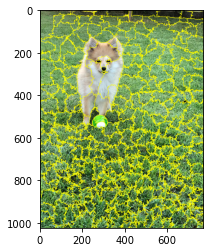

In [21]:
# Your solution here
segments_quick = quickshift(rocki, kernel_size=10, ratio=1, max_dist=20)

print(f"Quickshift number of segments: {len(np.unique(segments_quick))}")
plt.imshow(mark_boundaries(rocki,segments_quick))
plt.show()

h) Test different parameters in order to obtain a good image segmentation with Quickshift algorithm.
Answer the following qüestions:
- Which are the optimal values?
    - Again, depends on what we're searching. If we want to optimise time we need a small kenrel_size, if we want to give more weight to color-space we need to use a higher ratio (without exceding the limit(1))... The values we have used are: kernel_size=10, ratio=1, max_dist=20


- How does each parameter behave?
    - **ratio:** float, optional, between 0 and 1 -> Balances color-space proximity and image-space proximity. Higher values give more weight to color-space.
    - **kernel_size:** float, optional -> Width of Gaussian kernel used in smoothing the sample density. Higher means fewer clusters.
    - **max_dist:** float, optional -> Cut-off point for data distances. Higher means fewer clusters

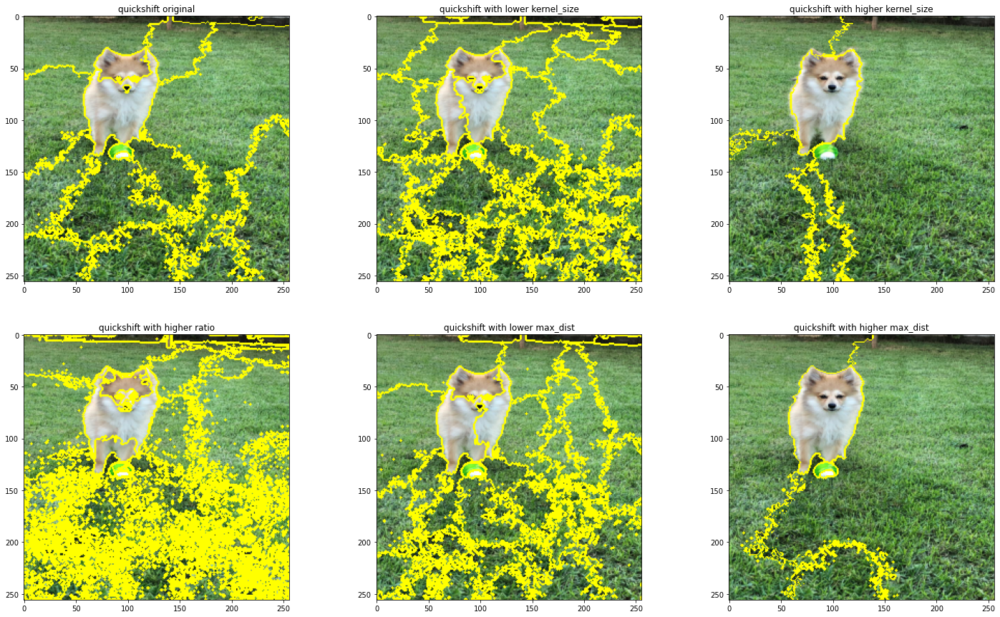

In [22]:
# Your solution here
segments_quick_reshape = quickshift(rocki_reshape, kernel_size=10, ratio=1, max_dist=20)

test0 = quickshift(rocki_reshape, kernel_size=5, ratio=1, max_dist=20)
test1 = quickshift(rocki_reshape, kernel_size=20, ratio=1, max_dist=20)
test2 = quickshift(rocki_reshape, kernel_size=10, ratio=3, max_dist=20)
test3 = quickshift(rocki_reshape, kernel_size=10, ratio=1, max_dist=10)
test4 = quickshift(rocki_reshape, kernel_size=10, ratio=1, max_dist=50)

fig, axs = plt.subplots(nrows=2,ncols=3,figsize=(25,15))

ax = axs[0][0]
ax.imshow(mark_boundaries(rocki_reshape,segments_quick_reshape))
ax.set_title("quickshift original")
ax = axs[0][1]
ax.imshow(mark_boundaries(rocki_reshape,test0))
ax.set_title("quickshift with lower kernel_size")
ax = axs[0][2]
ax.imshow(mark_boundaries(rocki_reshape,test1))
ax.set_title("quickshift with higher kernel_size")

ax = axs[1][0]
ax.imshow(mark_boundaries(rocki_reshape,test2))
ax.set_title("quickshift with higher ratio")
ax = axs[1][1]
ax.imshow(mark_boundaries(rocki_reshape,test3))
ax.set_title("quickshift with lower max_dist")
ax = axs[1][2]
ax.imshow(mark_boundaries(rocki_reshape,test4))
ax.set_title("quickshift with higher max_dist")

plt.show()

i) Comment what the algorithm is (in up to 3 lines).

In [23]:
# Your solution here
# Quickshift is a relatively recent 2D image segmentation algorithm, based on an approximation of kernelized mean-shift.
# One of the benefits of quickshift is that it actually computes a hierarchical segmentation on multiple scales simultaneously.

### Comparison of segmentation algorithms
j) Plot the original image and the results of both algorithms in a 1x3 subplot using the optimal values.

Text(0.5, 1.0, 'Quickshift method')

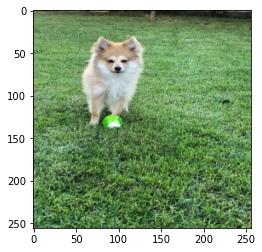

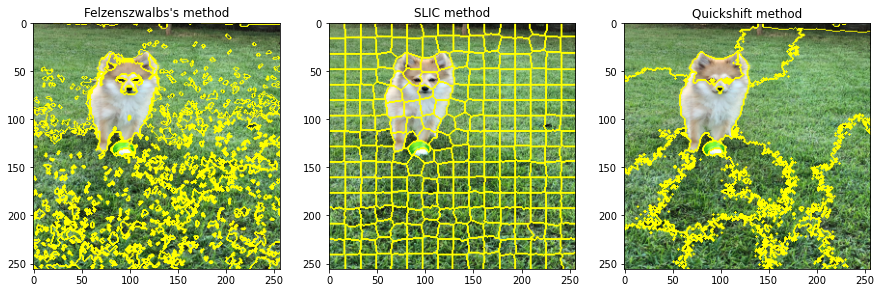

In [24]:
# Your solution here
plt.imshow(rocki_reshape)
fig, axs = plt.subplots(ncols=3,figsize=(15,15))

ax = axs[0]
ax.imshow(mark_boundaries(rocki_reshape, segments_fz))
ax.set_title("Felzenszwalbs's method")
ax = axs[1]
ax.imshow(mark_boundaries(rocki_reshape,slic_rocki_reshape))
ax.set_title("SLIC method")
ax = axs[2]
ax.imshow(mark_boundaries(rocki_reshape,segments_quick_reshape))
ax.set_title("Quickshift method")

k) Calculate also the number of segments obtained on the image by each of the algorithms. Can the number of segments can be used as a criterion for the performance of the algorithms?

In [25]:
# Your solution here
print(f"Felzenszwalb number of segments: {len(np.unique(segments_fz))}")
print(f"SLIC number of segments: {len(np.unique(slic_rocki_reshape))}")
print(f"Quickshift number of segments: {len(np.unique(segments_quick_reshape))}")

Felzenszwalb number of segments: 522
SLIC number of segments: 256
Quickshift number of segments: 17


l) Comment the differences between each method as well as their advantages and disadvantages.

    On the one Hand, Felzenszwalb method is based in the efficient graph-based image segmentation algorithm.
    It consists in use a graph and separate it in components. Using the difference between two components and the maximum weigth of an edge that connects two nodes of the same component
    Advantages: It's a fast algorithm (O(N·log(N)), take into account that an object might have invariance in intensity
    Disadvantages: we don't know when we should stop or when we should continue

    On the other hand, Slic method is based in the k-means clustering algorithm. It consists in select random points as initial clusters centers,determine points in this center and use the Euclidian distance to fins the closest point. This is repeated and will converge to a local minimum.

    The principal difference is that the efficient graph-based image segmentation starts with each point as its own cluster and iteratively merge the closest two clusters. On the other hand, k-means cluster iteratively re-assign points to the nearest cluster center. The two algorithms are very simple, but the first one is faster but we can't know when we should stop, and we don't know how to calculate the distance between points too. And k-means is less sensitive to outliers and slower because needs a lot of memory to pick the points (called seeds).

    Quickshift is a relatively recent 2D image segmentation algorithm, based on an approximation of kernelized mean-shift.
    One of the benefits of quickshift is that it actually computes a hierarchical segmentation on multiple scales simultaneously.


m) Choose another couple of color and grayscale images from the folder 'images' as well as from internet and apply the three segmentation methods. Comment the results.

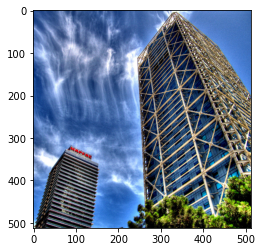

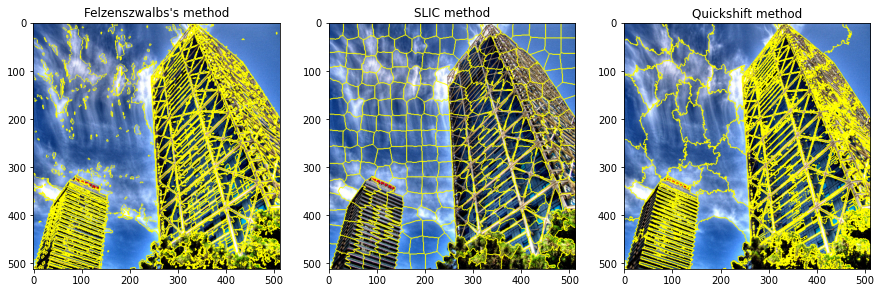

In [26]:
# Your solution here
img1 = io.imread("./images/mapfre.jpg")
quickshift1 = quickshift(img1, kernel_size=10, ratio=1, max_dist=20)
slic1 = slic(img1, n_segments=250, compactness=50, sigma=1, start_label=1)
felzenszwalb1 = felzenszwalb(img1, scale=500, sigma=0.3, min_size=5)
plt.imshow(img1)

fig, axs = plt.subplots(ncols=3,figsize=(15,15))

ax = axs[0]
ax.imshow(mark_boundaries(img1, felzenszwalb1))
ax.set_title("Felzenszwalbs's method")
ax = axs[1]
ax.imshow(mark_boundaries(img1,slic1))
ax.set_title("SLIC method")
ax = axs[2]
ax.imshow(mark_boundaries(img1,quickshift1))
ax.set_title("Quickshift method")

plt.show()

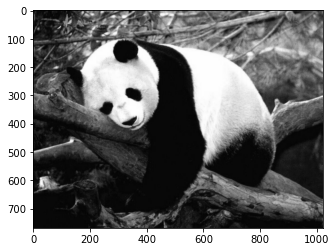

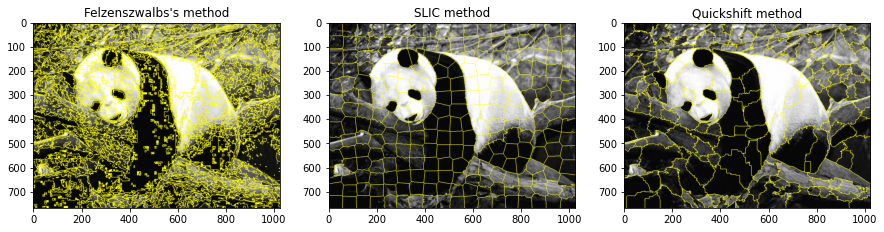

In [27]:
img2= io.imread("./images/panda.jpg")
quickshift2 = quickshift(img2, kernel_size=10, ratio=1, max_dist=20)
slic2 = slic(img2, n_segments=250, compactness=50, sigma=1, start_label=1)
felzenszwalb2 = felzenszwalb(img2, scale=500, sigma=0.3, min_size=5)

plt.imshow(img2)
fig, axs = plt.subplots(ncols=3,figsize=(15,15))

ax = axs[0]
ax.imshow(mark_boundaries(img2, felzenszwalb2))
ax.set_title("Felzenszwalbs's method")
ax = axs[1]
ax.imshow(mark_boundaries(img2,slic2))
ax.set_title("SLIC method")
ax = axs[2]
ax.imshow(mark_boundaries(img2,quickshift2))
ax.set_title("Quickshift method")

plt.show()